# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import tensorflow as tf
%matplotlib inline

In [2]:
# Load training set
dataset = get_dataset("./data/train/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['./data/train/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['./data/train/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 80
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


## Write a function to display an image and the bounding boxes

Implement the `display_images` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
def display_images(batch):
    color_dict = {1:'r', 2:'b', 4:'g'}
    for sample in batch:
        image = sample['image']
        w,h, _ = tf.shape(image).numpy()
        gt_bb = sample['groundtruth_boxes']
        gt_cls = sample['groundtruth_classes']
        fig, ax = plt.subplots(figsize=(10,10))
        ax.imshow(image.numpy())
        for idx, bb in enumerate(gt_bb):
            bb = bb.numpy()
            cls = gt_cls[idx].numpy()
            rect = patches.Rectangle((bb[1]*h, bb[0]*w), (bb[3] - bb[1])*h, (bb[2] - bb[0])*w, linewidth = 1, edgecolor=color_dict[cls], facecolor='none')
            ax.add_patch(rect)
        plt.show()

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

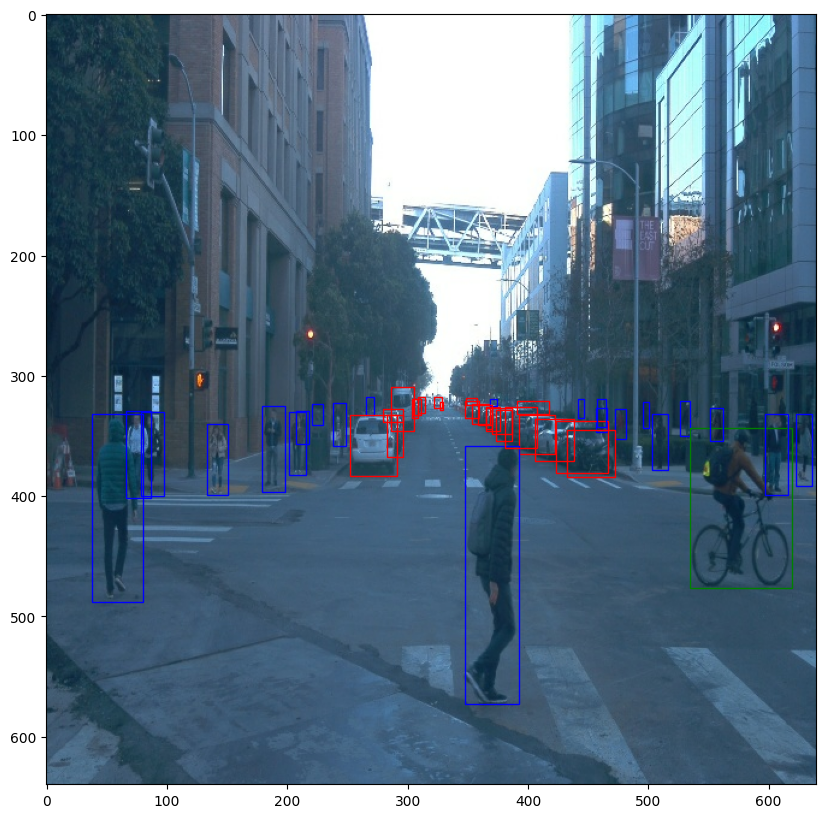

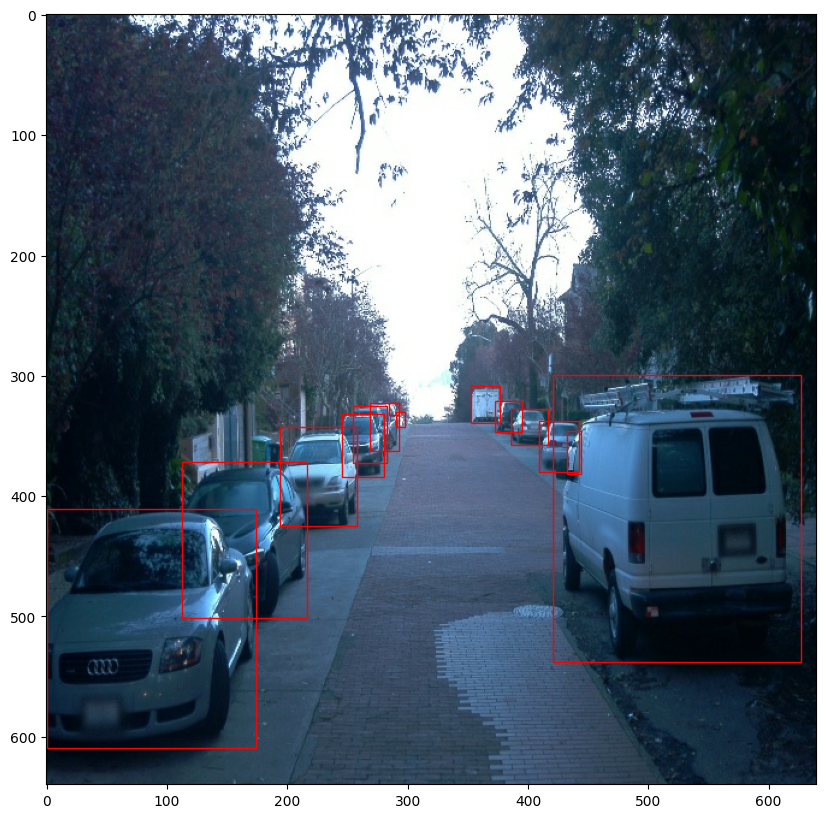

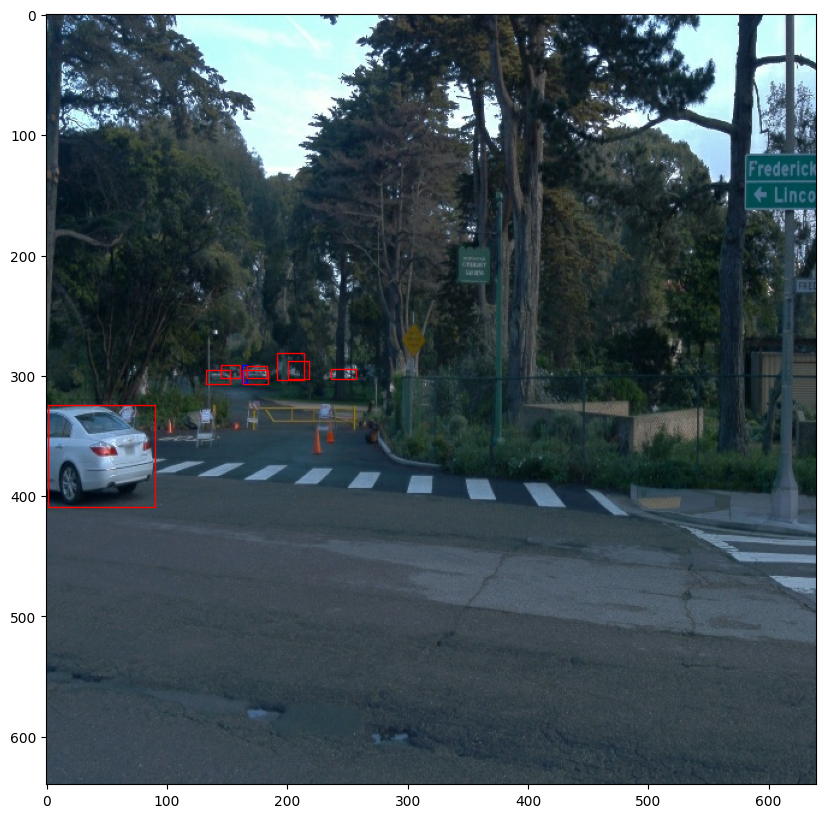

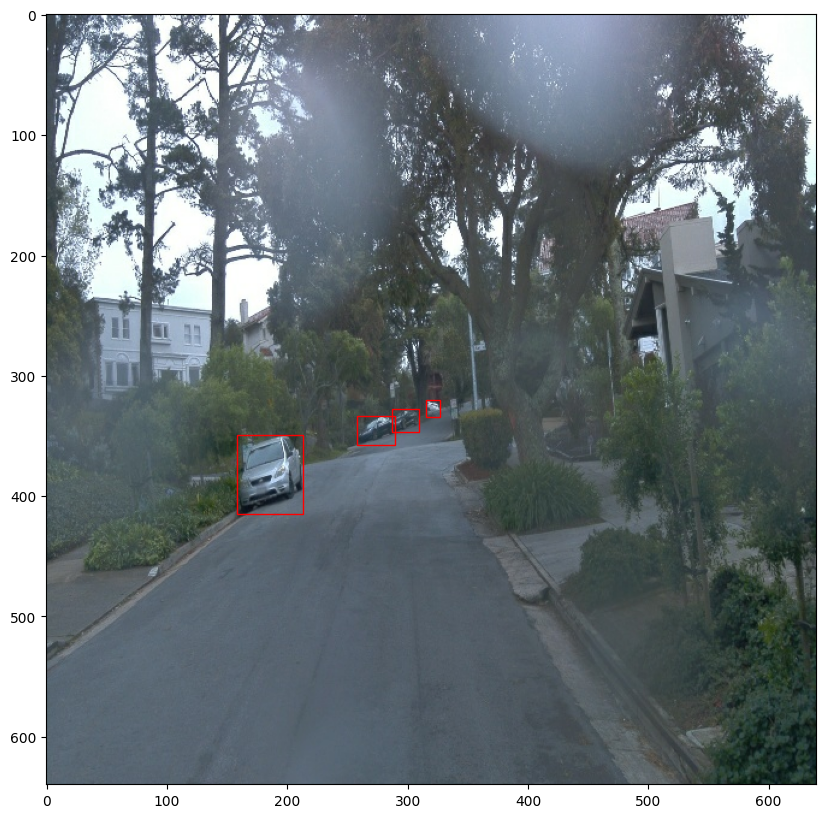

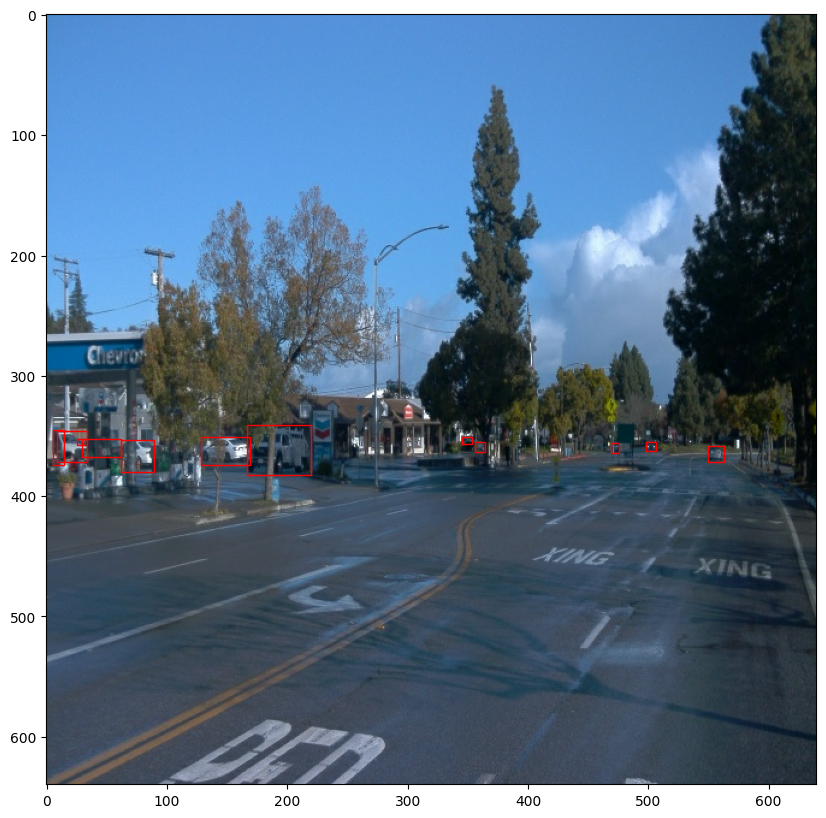

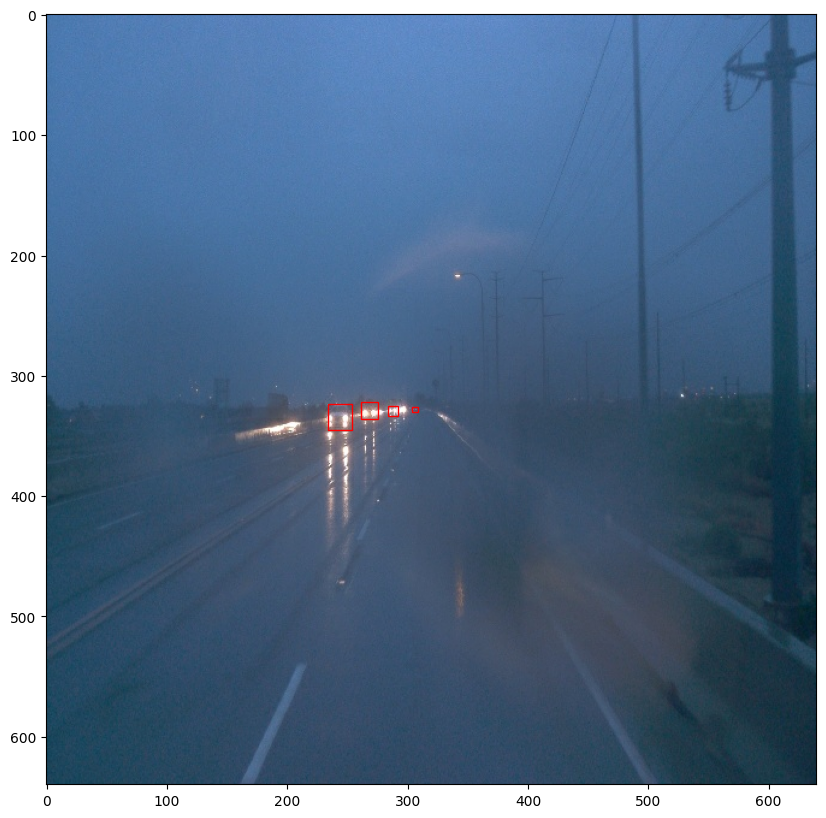

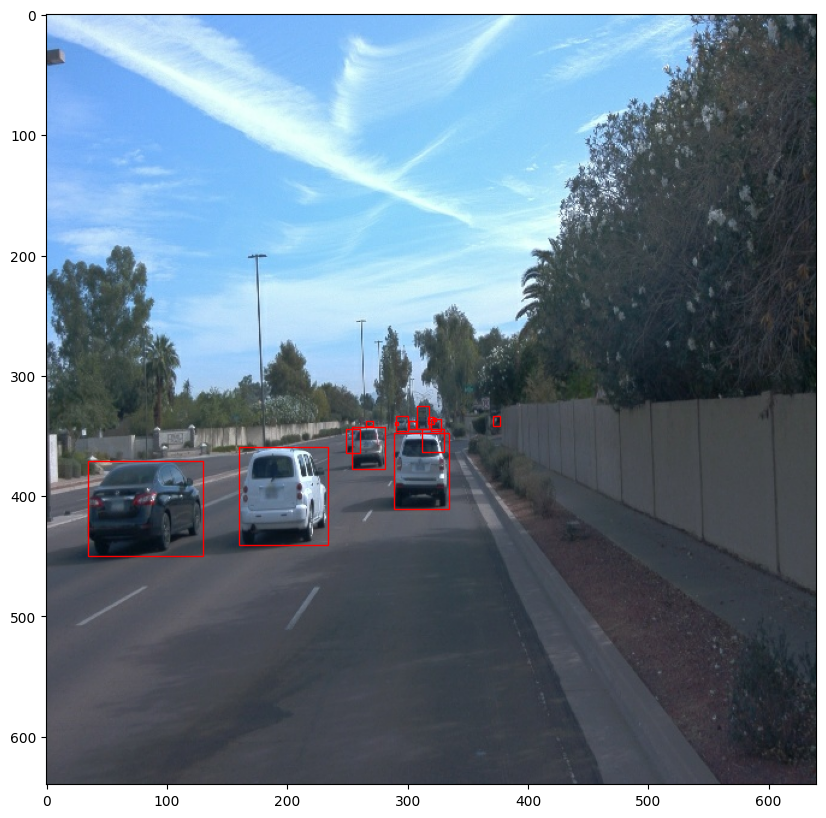

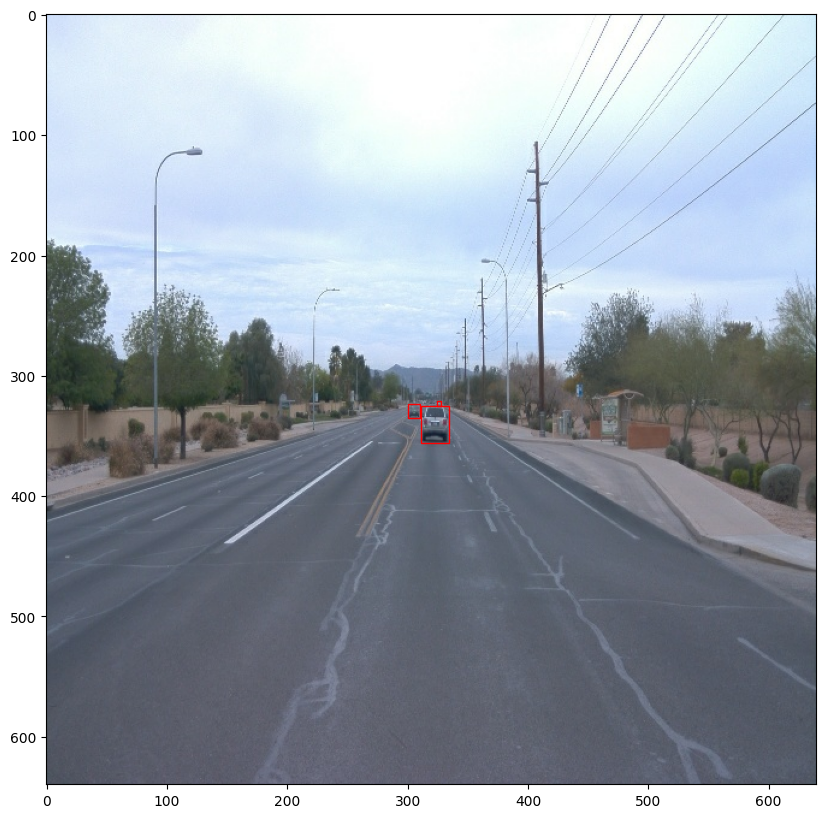

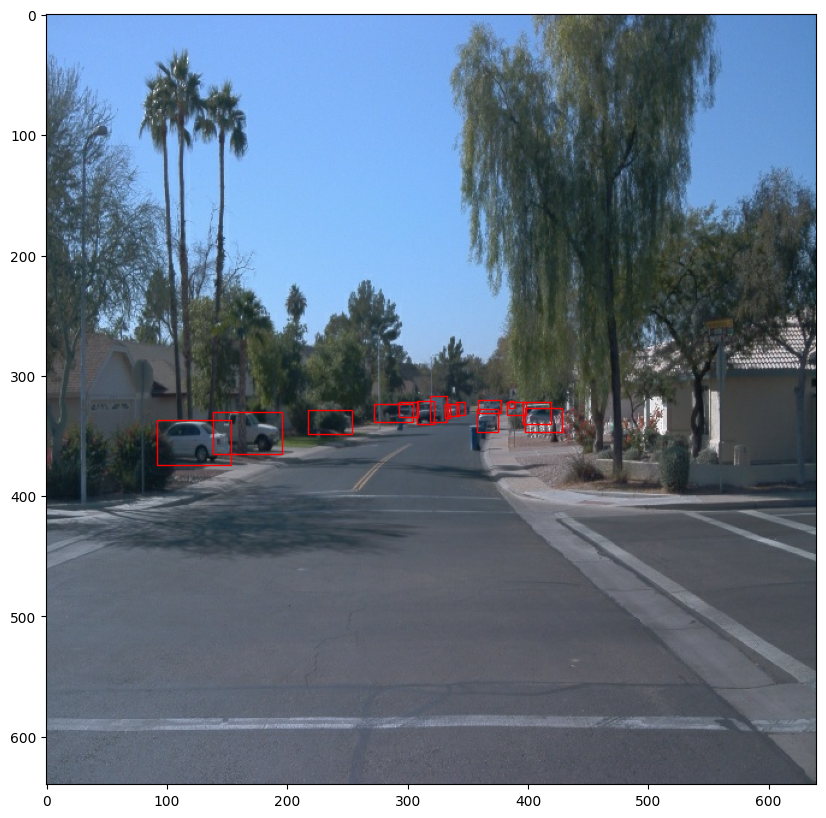

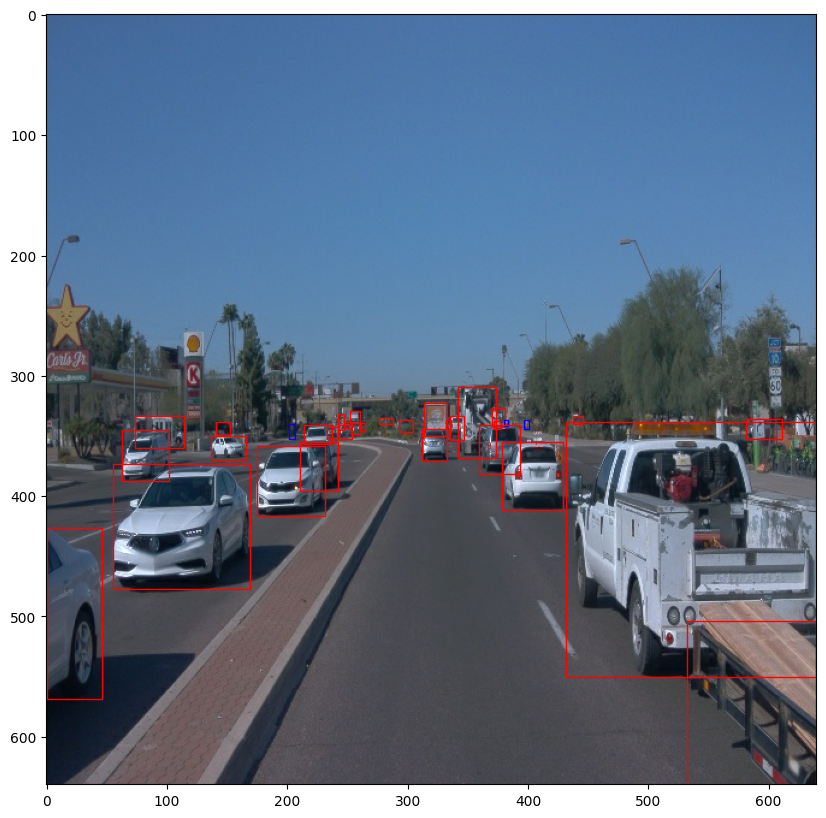

In [25]:
# Display 10 images
batch = dataset.take(10)
display_images(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [5]:
# Compute number of images and corresponding labels
def get_number_of_images_and_labels(dataset, batch_size):
    images_number = 0
    cls_number_dict = {1:0, 2:0, 4:0}
    for sample in dataset.take(batch_size):
        images_number += 1
        gt_cls = sample['groundtruth_classes']
        for classe in gt_cls:
            cls_number_dict[classe.numpy()] += 1
    return images_number, cls_number_dict

In [33]:
def print_number_of_images_and_labels(images_number, cls_number_dict, dataset_name):
    dict_of_names = {1:"car", 2:"pedestrians", 4:"cyclist"}
    print(f"Total images: {images_number} in {dataset_name}")
    total_labels = sum(cls_number_dict.values())
    for key in cls_number_dict.keys():
        print(f"Class {dict_of_names[key]} has {cls_number_dict[key]} bounding box in {dataset_name} dataset, which consist {round(100 * cls_number_dict[key]/total_labels, 2)} % of total labels")

In [34]:
# Compute number of images and labels of Training dataset
images_number_train, cls_number_dict_train = get_number_of_images_and_labels(dataset=dataset, batch_size=50000)
print_number_of_images_and_labels(images_number_train, cls_number_dict_train, dataset_name="training")

Total images: 50000 in training
Class car has 817748 bounding box in training dataset, which consist 77.56 % of total labels
Class pedestrians has 230927 bounding box in training dataset, which consist 21.9 % of total labels
Class cyclist has 5680 bounding box in training dataset, which consist 0.54 % of total labels


In [11]:
def plot_number_labels_per_class(cls_number_dict):
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    classes = ["cars", "pedestrians", "cyclist"]
    labels_count = [cls_number_dict[key] for key in cls_number_dict.keys()]
    ax.bar(classes,labels_count)
    plt.show()

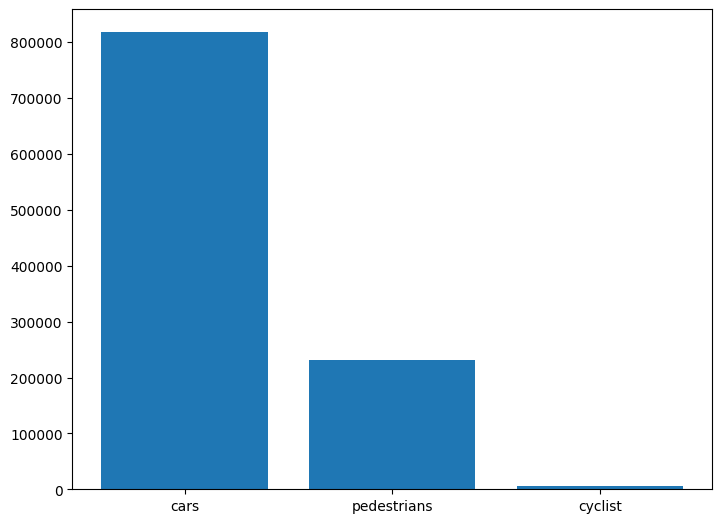

In [12]:
# Plot number of labels per class for the validation set
plot_number_labels_per_class(cls_number_dict_train)

In [14]:
# Load validation dataset
validation_dataset = get_dataset("./data/val/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['./data/val/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['./data/val/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 10


In [22]:
# Compute number of images and labels of validation dataset
images_number_val, cls_number_dict_val = get_number_of_images_and_labels(dataset=validation_dataset, batch_size=50000)
print_number_of_images_and_labels(images_number_val, cls_number_dict_val, dataset_name="validation")

Total images: 50000 in validation
Classe 1 has 1217205 bounding box in validation dataset
Classe 2 has 381696 bounding box in validation dataset
Classe 4 has 11753 bounding box in validation dataset


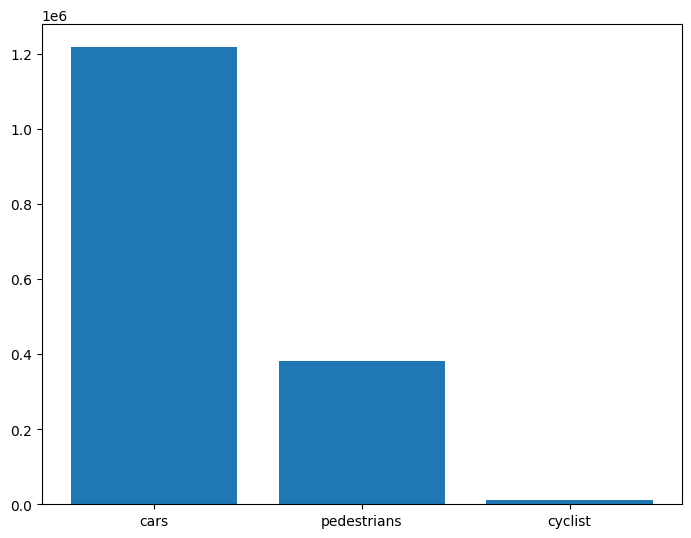

In [23]:
# Plot number of labels per class for the validation set
plot_number_labels_per_class(cls_number_dict_val)